In [1]:
from isochrones.starmodel import BinaryStarModel, StarModel

%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

from isochrones.mist import MIST_Isochrone
from isochrones.dartmouth import Dartmouth_Isochrone as DI

dar = DI()
mist = MIST_Isochrone()

Load in the data and set boundaries. Stars aren't younger than 1 Myr; not older than the age of the universe. N=1,2 means the faint star is a single star and we allow the brighter object to be a binary.

In [2]:
mod = StarModel.from_ini(mist, ini_file='star.ini', N=[1,2])
mod.set_bounds(age=(6, 10.5), feh=(-1,1))

Inspect the photometry

In [3]:
mod.obs.print_ascii()


root
 ╠═ KIC G=(15.41, 0.02) @(0.00, 0 [1.00])
 ║  ╚═ KIC H=(14.01, 0.04) @(0.00, 0 [1.00])
 ║     ╚═ KIC J=(14.31, 0.03) @(0.00, 0 [1.00])
 ║        ╚═ KIC K=(14.06, 0.05) @(0.00, 0 [1.00])
 ║           ╚═ KIC g=(15.89, 0.08) @(0.00, 0 [1.00])
 ║              ╚═ KIC i=(15.22, 0.05) @(0.00, 0 [1.00])
 ║                 ╚═ KIC r=(15.37, 0.05) @(0.00, 0 [1.00])
 ║                    ╚═ KIC z=(15.20, 0.05) @(0.00, 0 [1.00])
 ║                       ╚═ 0_1, parallax=[0.6188, 0.0189]
 ╚═ KIC G=(14.37, 0.02) @(4.00, 85 [1.00])
    ╚═ KIC H=(13.02, 0.04) @(4.00, 85 [1.00])
       ╚═ KIC J=(13.32, 0.04) @(4.00, 85 [1.00])
          ╚═ KIC K=(12.94, 0.04) @(4.00, 85 [1.00])
             ╚═ KIC g=(14.85, 0.08) @(4.00, 85 [1.00])
                ╚═ KIC i=(14.21, 0.05) @(4.00, 85 [1.00])
                   ╚═ KIC r=(14.34, 0.05) @(4.00, 85 [1.00])
                      ╚═ KIC z=(14.19, 0.05) @(4.00, 85 [1.00])
                         ╠═ 0_0, parallax=[0.6188, 0.0189]
                         ╚═ 0

Let everything run and see what we get. Initial guess is reasonable, but not exact, so walkers should all wander away from the distance estimate. Initial guesses are mass, mass, mass, age, Feh, Distance, A_v in Msun, Msun, Msun, log yr, dex, pc, mags

In [22]:
mod.use_emcee=True

p0 = [1.3, 1.2, 1.3, 9.2, 0.1, 1500, 0.4]

mod.fit(nwalkers=250,nburn=2700,niter=500,p0=p0,initial_burn=True)

Let's see the corner plot

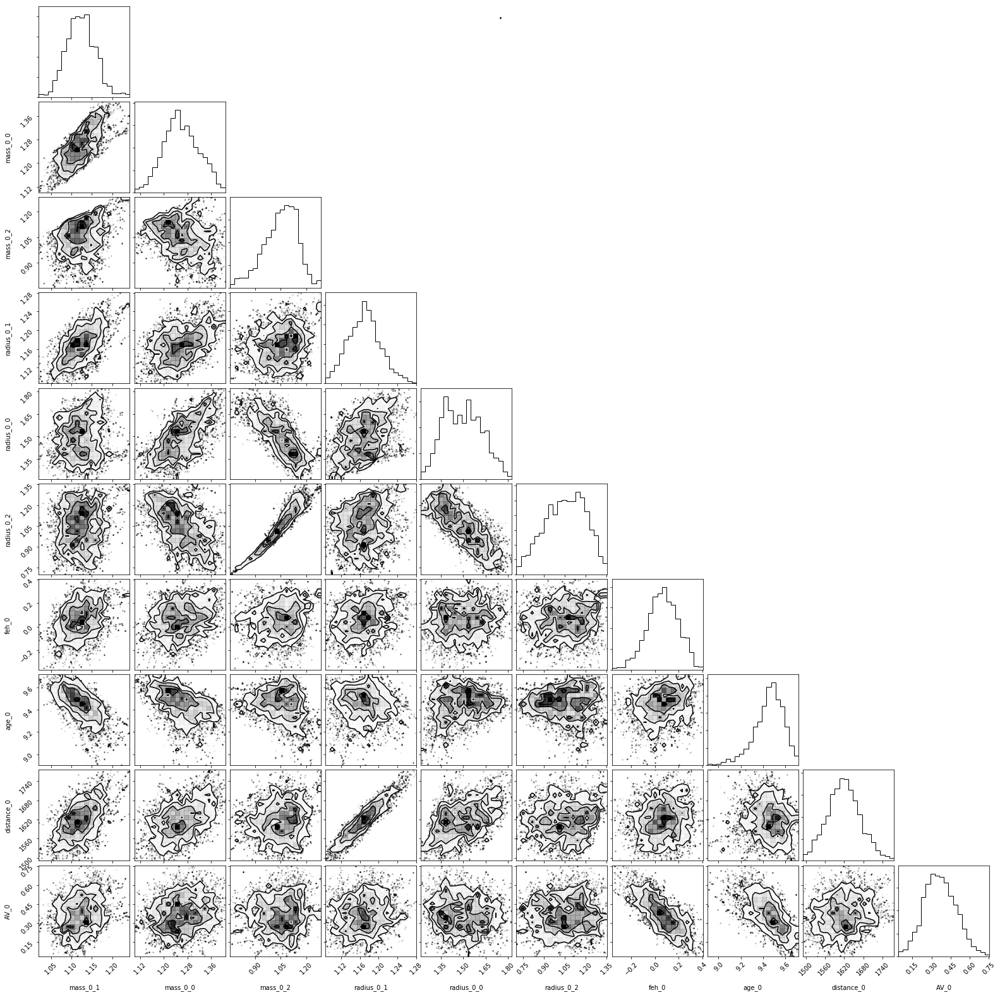

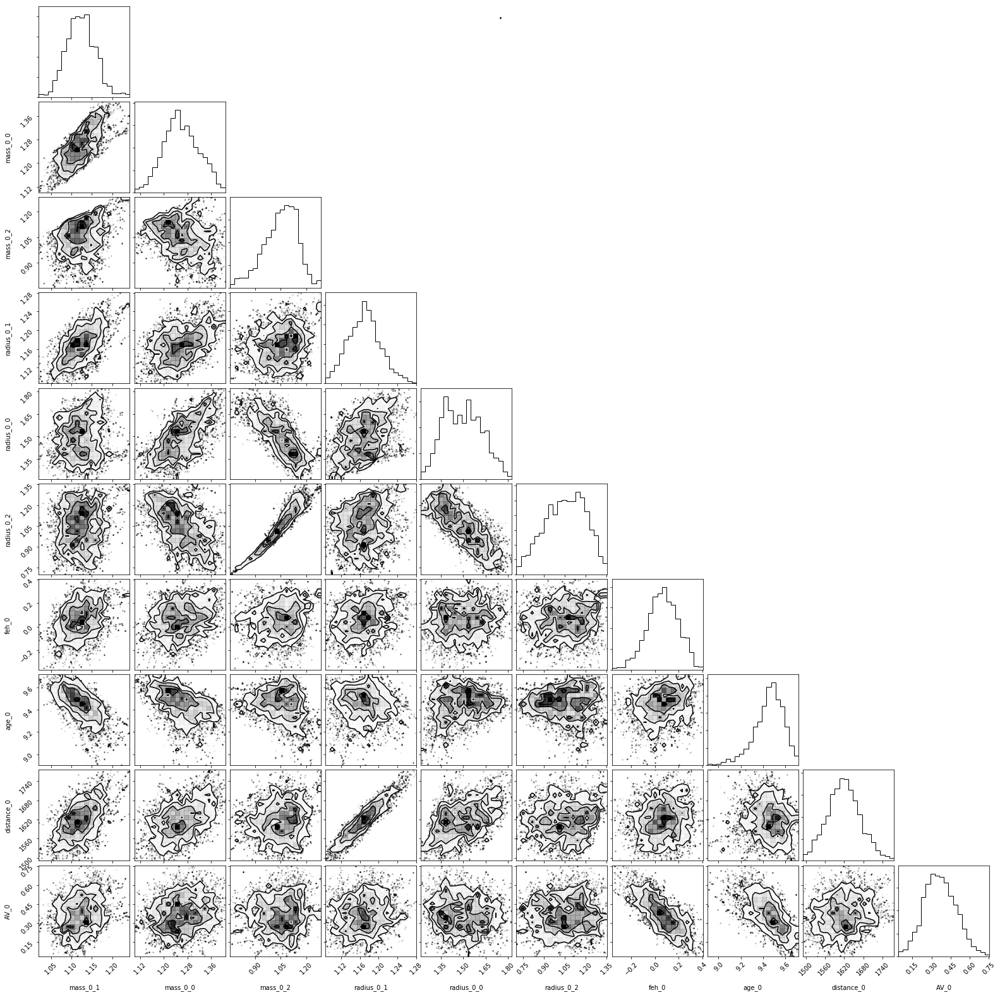

In [23]:
mod.corner_physical()

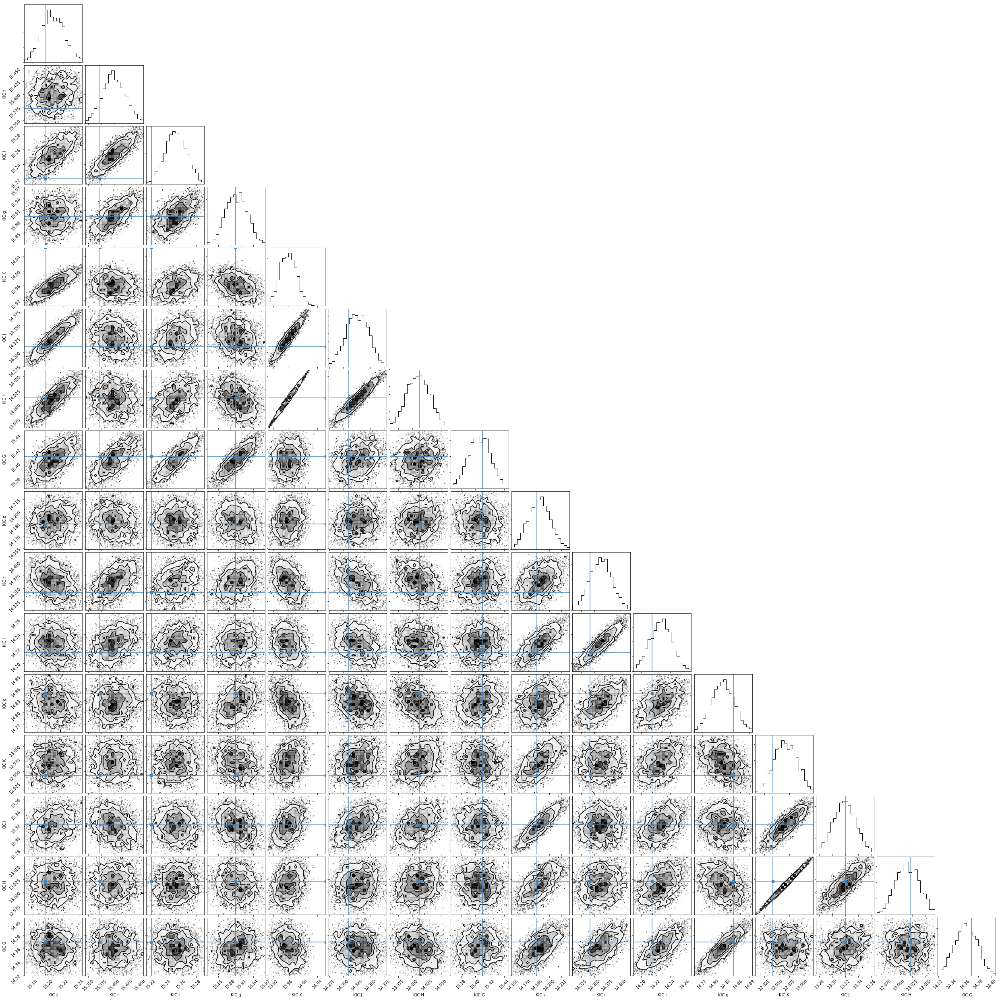

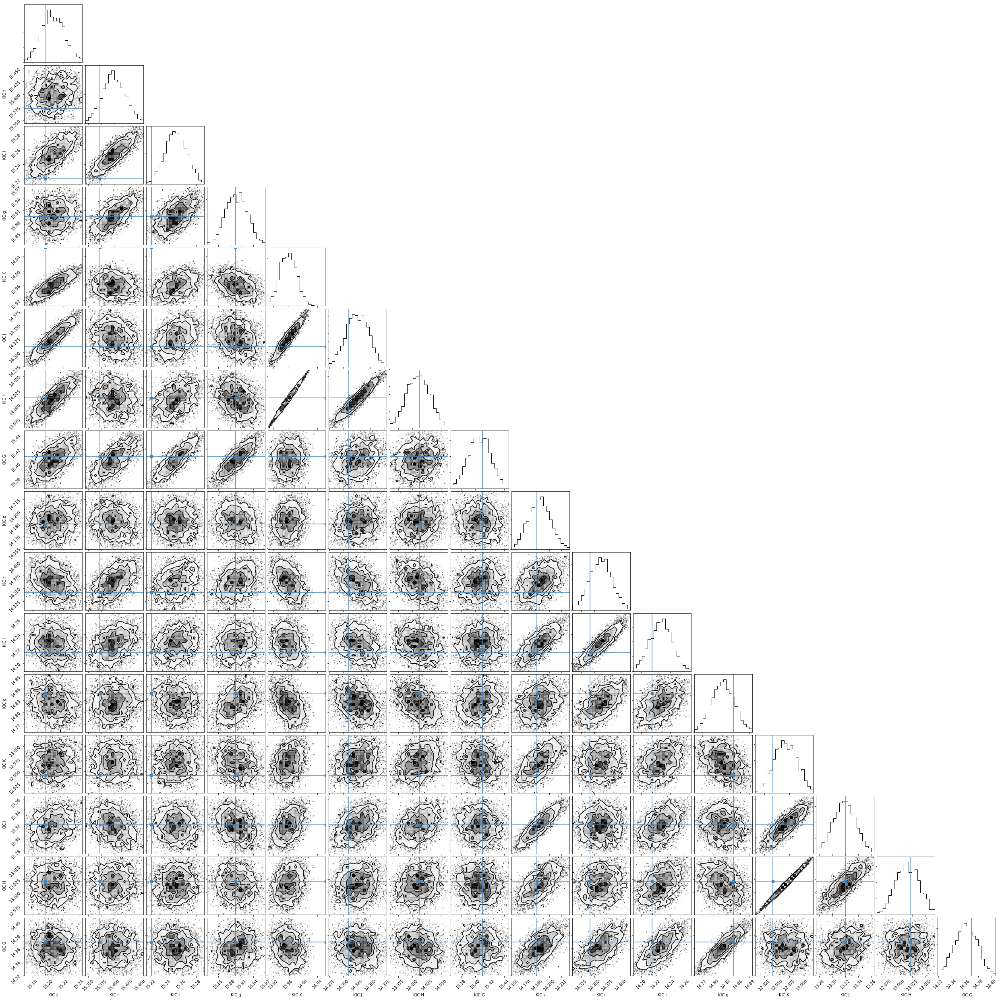

In [24]:
mod.corner_observed()

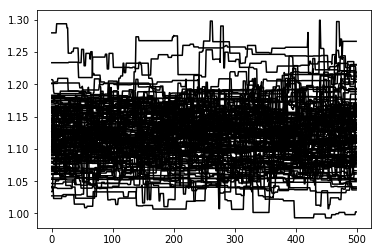

In [34]:
plt.plot(mod.sampler.chain[::2,:,1].T, 'k')

Things look reasonable! Perhaps more steps when we do the production run but everything looks reasonably converged. Age has almost no power below 2 Gyr, which is heartening. Now let's say the primary must be a single star, not a binary.

In [17]:
mod1 = StarModel.from_ini(mist, ini_file='star.ini', N=[1,1])
mod1.set_bounds(age=(6, 10.5), feh=(-1,1))

In [18]:
mod1.obs.print_ascii()


root
 ╠═ KIC G=(15.41, 0.02) @(0.00, 0 [1.00])
 ║  ╚═ KIC H=(14.01, 0.04) @(0.00, 0 [1.00])
 ║     ╚═ KIC J=(14.31, 0.03) @(0.00, 0 [1.00])
 ║        ╚═ KIC K=(14.06, 0.05) @(0.00, 0 [1.00])
 ║           ╚═ KIC g=(15.89, 0.08) @(0.00, 0 [1.00])
 ║              ╚═ KIC i=(15.22, 0.05) @(0.00, 0 [1.00])
 ║                 ╚═ KIC r=(15.37, 0.05) @(0.00, 0 [1.00])
 ║                    ╚═ KIC z=(15.20, 0.05) @(0.00, 0 [1.00])
 ║                       ╚═ 0_1, parallax=[0.6188, 0.0189]
 ╚═ KIC G=(14.37, 0.02) @(4.00, 85 [1.00])
    ╚═ KIC H=(13.02, 0.04) @(4.00, 85 [1.00])
       ╚═ KIC J=(13.32, 0.04) @(4.00, 85 [1.00])
          ╚═ KIC K=(12.94, 0.04) @(4.00, 85 [1.00])
             ╚═ KIC g=(14.85, 0.08) @(4.00, 85 [1.00])
                ╚═ KIC i=(14.21, 0.05) @(4.00, 85 [1.00])
                   ╚═ KIC r=(14.34, 0.05) @(4.00, 85 [1.00])
                      ╚═ KIC z=(14.19, 0.05) @(4.00, 85 [1.00])
                         ╚═ 0_0, parallax=[0.6188, 0.0189]


In [19]:
mod1.use_emcee=True

p0 = [1.3, 1.4, 9.2, 0.1, 1500, 0.4]
#print(np.shape(p0))
#print(np.shape(mod.emcee_p0(nwalkers=300)))
mod1.fit(nwalkers=200,nburn=1200,niter=200,p0=p0,initial_burn=True)

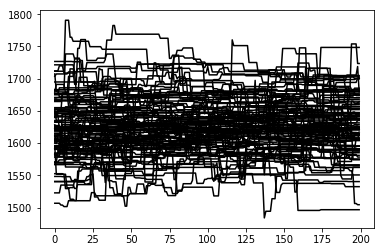

In [20]:
plt.plot(mod1.sampler.chain[::2,:,4].T, 'k')

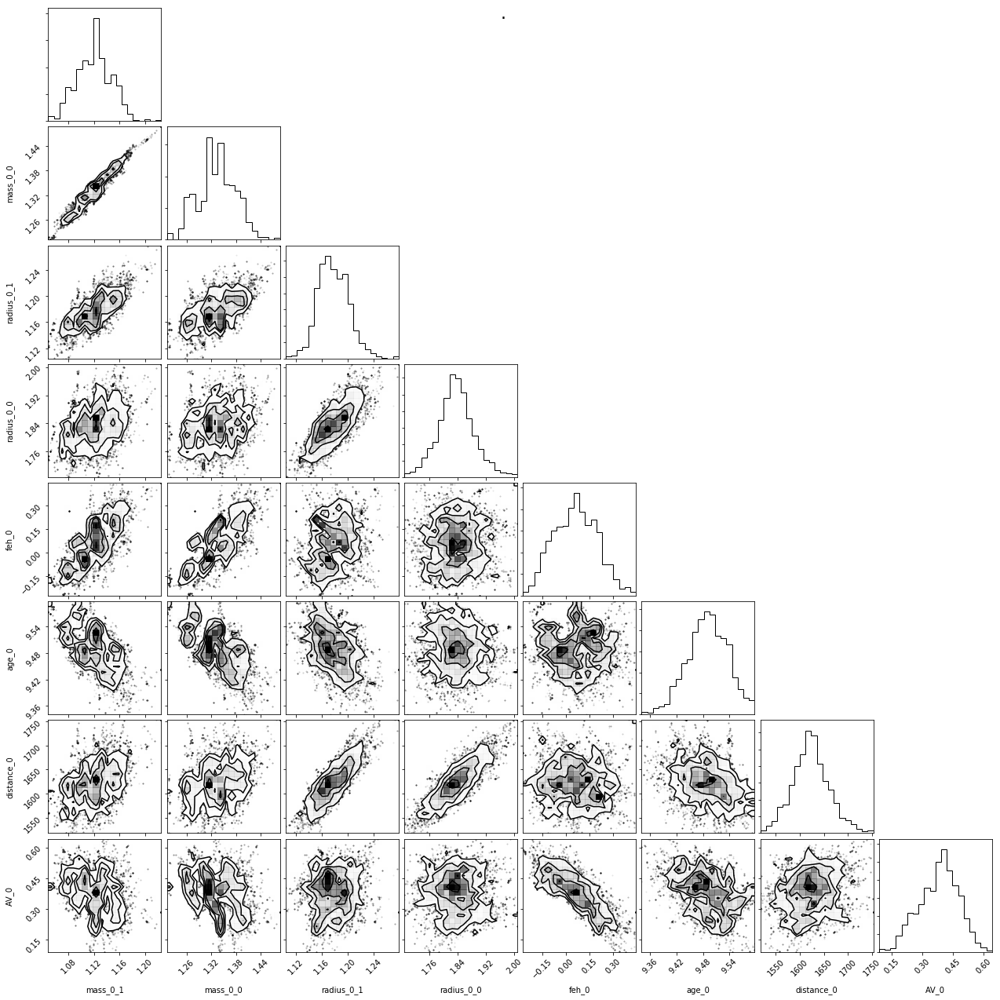

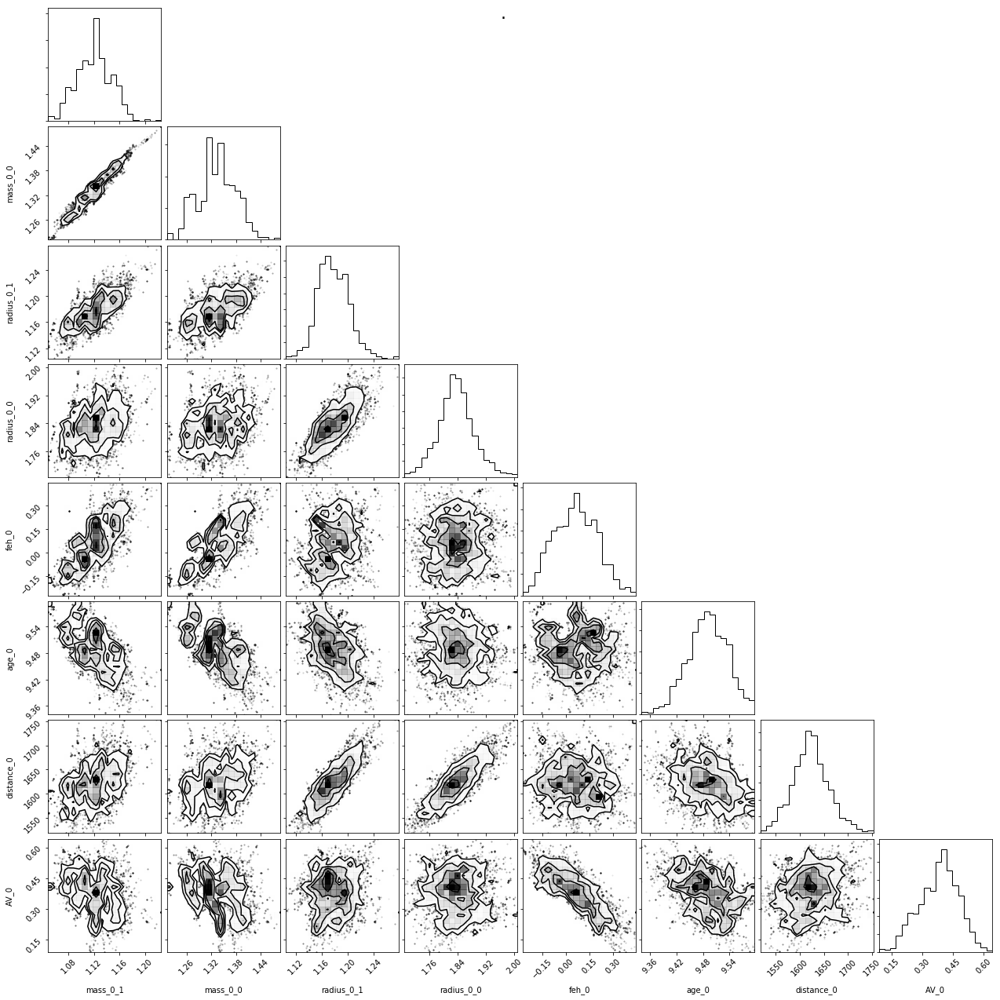

In [21]:
mod1.corner_physical()

In this case we have very tight ages!